Calculate the Bayes Factor for $u-r$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [14]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import corner

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [2]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [3]:
data_directory = '../../../../data/'
# data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'nsa_v1_0_1_VAGC_vflag-V2_sys_(1).fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [4]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [5]:
ur_NSA = np.array(catalog_main['u_r'])

# Separate galaxies by their $V^2$ LSS classifications

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

In [6]:
wall_noRmin = catalog_main['vflag_V2_noRmin'] == 0
void_noRmin = catalog_main['vflag_V2_noRmin'] == 1
edge_noRmin = catalog_main['vflag_V2_noRmin'] == 2
out_noRmin = catalog_main['vflag_V2_noRmin'] == 9

## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [7]:
wall_0p1 = catalog_main['vflag_V2_0p1rho'] == 0
void_0p1 = catalog_main['vflag_V2_0p1rho'] == 1
edge_0p1 = catalog_main['vflag_V2_0p1rho'] == 2
out_0p1 = catalog_main['vflag_V2_0p1rho'] == 9

## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [8]:
wall_0p3 = catalog_main['vflag_V2_0p3rho'] == 0
void_0p3 = catalog_main['vflag_V2_0p3rho'] == 1
edge_0p3 = catalog_main['vflag_V2_0p3rho'] == 2
out_0p3 = catalog_main['vflag_V2_0p3rho'] == 9

In [9]:
del catalog_main, catalog_north, data

# Fit the color distributions with skewnormal distributions

Both one- and two-parent models

This is a bimodal distribution

In [10]:
ur_bins = np.arange(0.5, 4, 0.05)

In [11]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

labels1_tri = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                    'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$', 
                    'c', r'$\mu_c$', r'$\sigma_c$', 'skew$_c$']
labels2_tri = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
               '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
               '$c_2$', r'$\mu_{1c}$', r'$\sigma_{1c}$', 'skew$_{1c}$', 
               '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
               '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$', 
               '$c_2$', r'$\mu_{2c}$', r'$\sigma_{2c}$', 'skew$_{2c}$']

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

### 1-parent model

In [17]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2-noRmin(1).pickle', 'rb')
# V2noRmin_results1 = pickle.load(temp_infile)
V2noRmin_results1_samples, lnzM1_V2noRmin = pickle.load(temp_infile)
temp_infile.close()

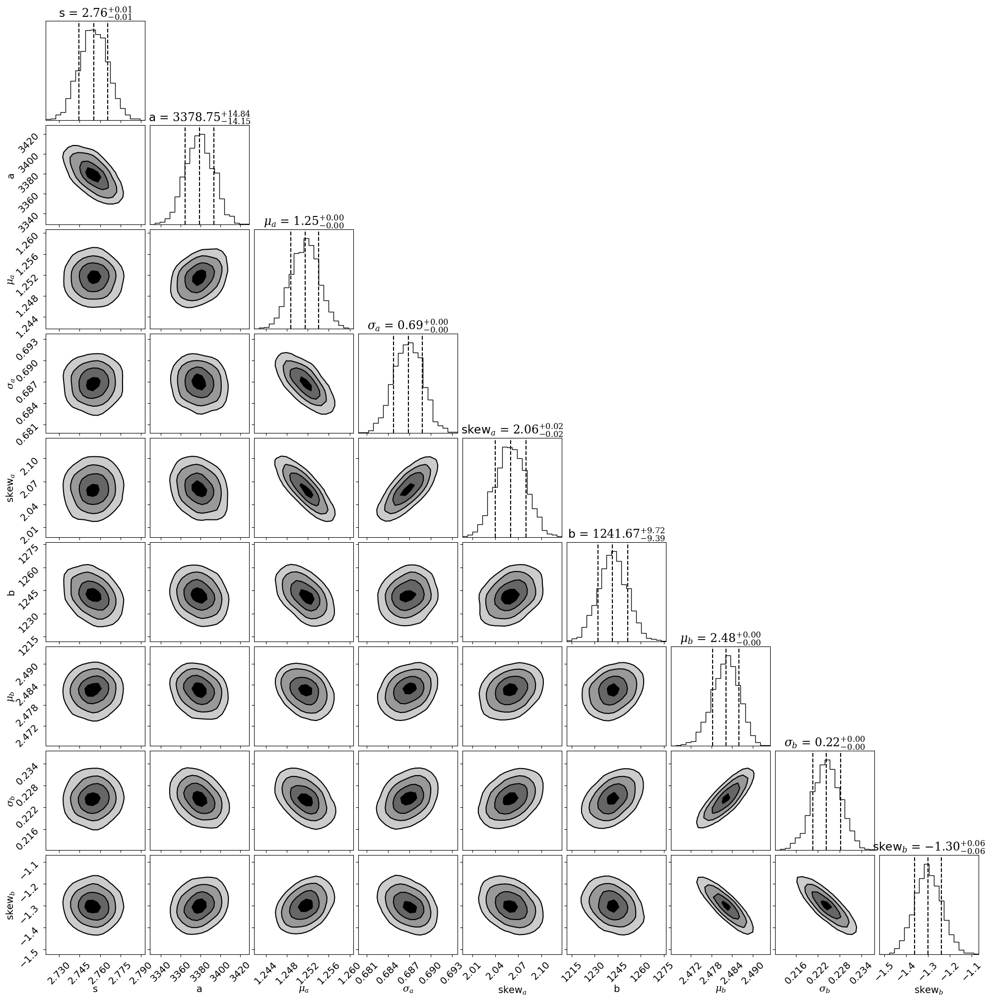

In [18]:
# pc.plotting.corner(V2noRmin_results1, 
corner.corner(V2noRmin_results1_samples,
              labels=labels1_bi, 
              dims=range(len(labels1_bi)), 
              show_titles=True, 
              quantiles=[0.16, 0.5, 0.84], 
              smooth=1, 
              plot_datapoints=False, 
              fill_contours=True);

In [19]:
# lnzM1_V2noRmin = V2noRmin_results1['logz'][-1]
lnzM1_V2noRmin

np.float64(-1353.9409765405521)

In [20]:
V2noRmin_bestfit1 = np.median(V2noRmin_results1_samples, axis=0)

V2noRmin_bestfit1

array([ 2.75523340e+00,  3.37875432e+03,  1.25152417e+00,  6.86839259e-01,
        2.06006661e+00,  1.24167011e+03,  2.48226914e+00,  2.24346825e-01,
       -1.29994204e+00])

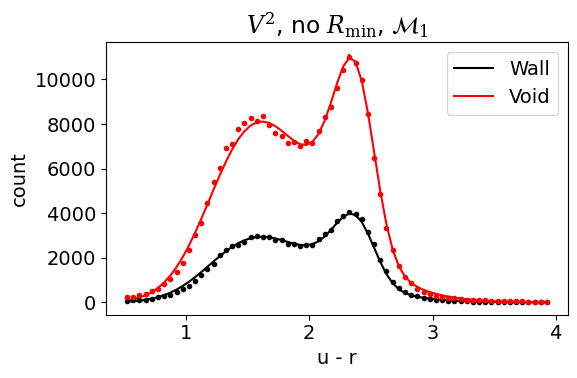

In [21]:
Model_1_plot(V2noRmin_bestfit1, 
             ur_NSA[wall_noRmin], 
             ur_NSA[void_noRmin], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$');

### 2-parent model

In [22]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2-noRmin.pickle', 'rb')
V2noRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

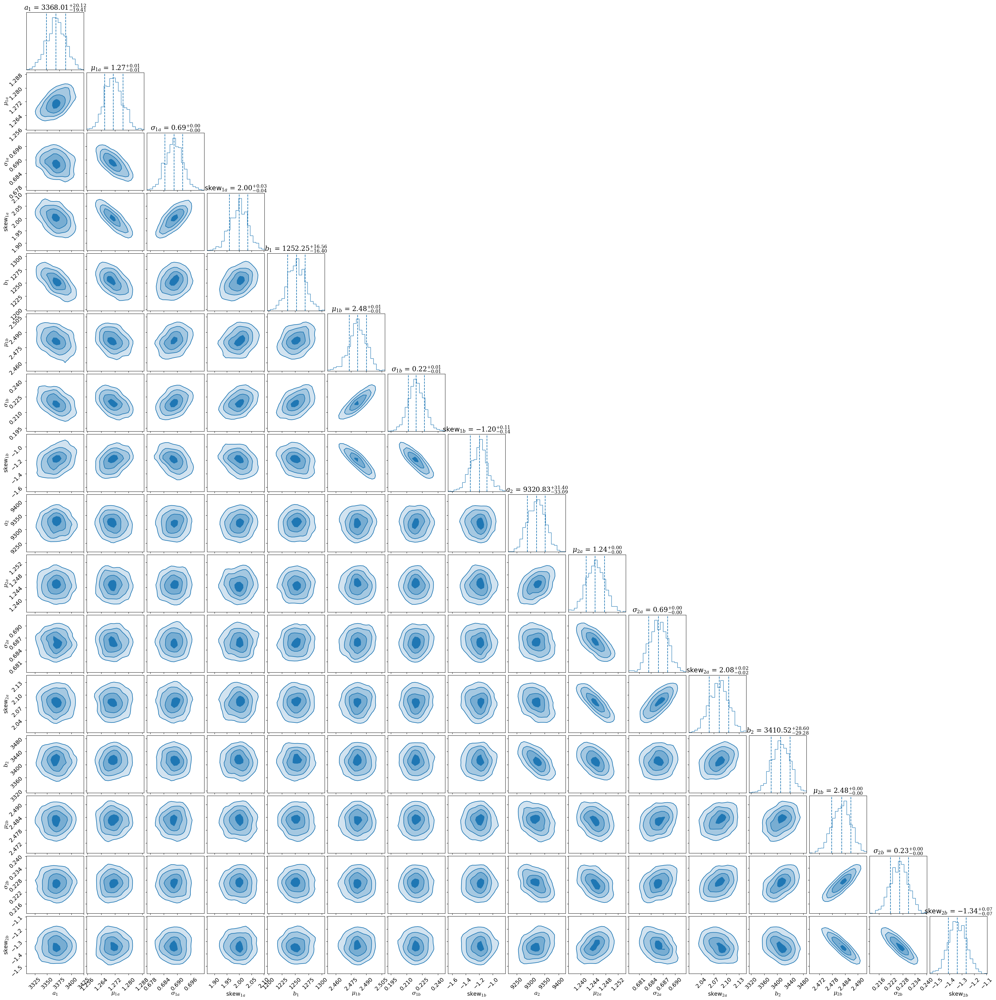

In [23]:
pc.plotting.corner(V2noRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [24]:
lnzM2_V2noRmin = V2noRmin_results2['logz'][-1]
lnzM2_V2noRmin

-1295.3885475065044

In [25]:
V2noRmin_bestfit2 = np.median(V2noRmin_results2['samples'], axis=0)

V2noRmin_bestfit2

array([ 3.3680098e+03,  1.2711132e+00,  6.8854892e-01,  1.9998432e+00,
        1.2522480e+03,  2.4814196e+00,  2.1917838e-01, -1.1969647e+00,
        9.3208320e+03,  1.2446370e+00,  6.8583107e-01,  2.0827351e+00,
        3.4105249e+03,  2.4824743e+00,  2.2635902e-01, -1.3369319e+00],
      dtype=float32)

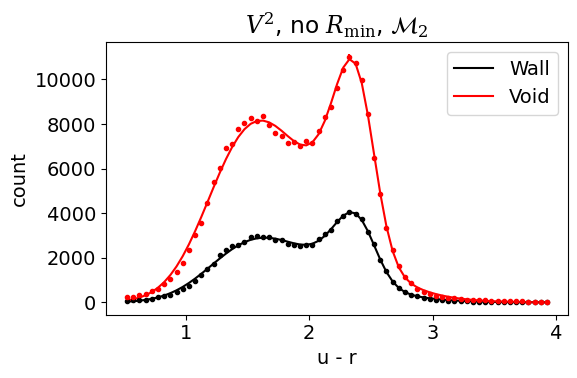

In [26]:
Model_2_plot(V2noRmin_bestfit2, 
             ur_NSA[wall_noRmin], 
             ur_NSA[void_noRmin], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [27]:
lnB12_V2noRmin = lnzM1_V2noRmin - lnzM2_V2noRmin

B12_V2noRmin = np.exp(lnB12_V2noRmin)

print('V2 u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2noRmin, lnB12_V2noRmin*np.log10(np.exp(1))))

V2 u-r: B12 = 1.45e-20; log(B12) = -19.838


## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [28]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2-0p1.pickle', 'rb')
V2_0p1_results1 = pickle.load(temp_infile)
temp_infile.close()

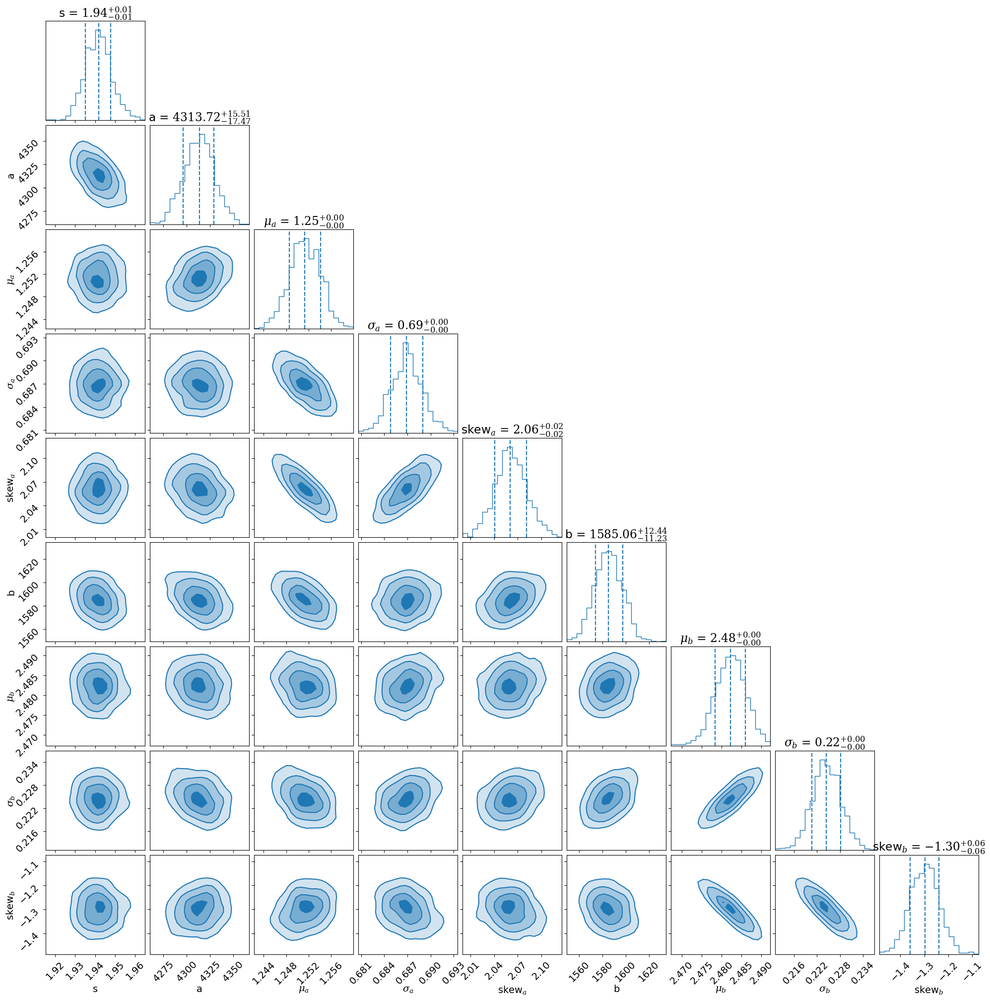

In [29]:
pc.plotting.corner(V2_0p1_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [30]:
lnzM1_V2_0p1 = V2_0p1_results1['logz'][-1]
lnzM1_V2_0p1

-1283.5577296336105

In [32]:
V2_0p1_bestfit1 = np.median(V2_0p1_results1['samples'], axis=0)

V2_0p1_bestfit1

array([ 1.9417353e+00,  4.3137188e+03,  1.2512763e+00,  6.8685663e-01,
        2.0603216e+00,  1.5850583e+03,  2.4822674e+00,  2.2446117e-01,
       -1.2976899e+00], dtype=float32)

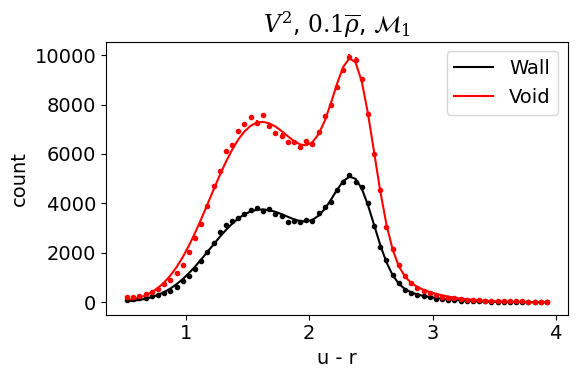

In [33]:
Model_1_plot(V2_0p1_bestfit1, 
             ur_NSA[wall_0p1], 
             ur_NSA[void_0p1], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_1$')

### 2-parent model

In [34]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2-0p1.pickle', 'rb')
V2_0p1_results2 = pickle.load(temp_infile)
temp_infile.close()

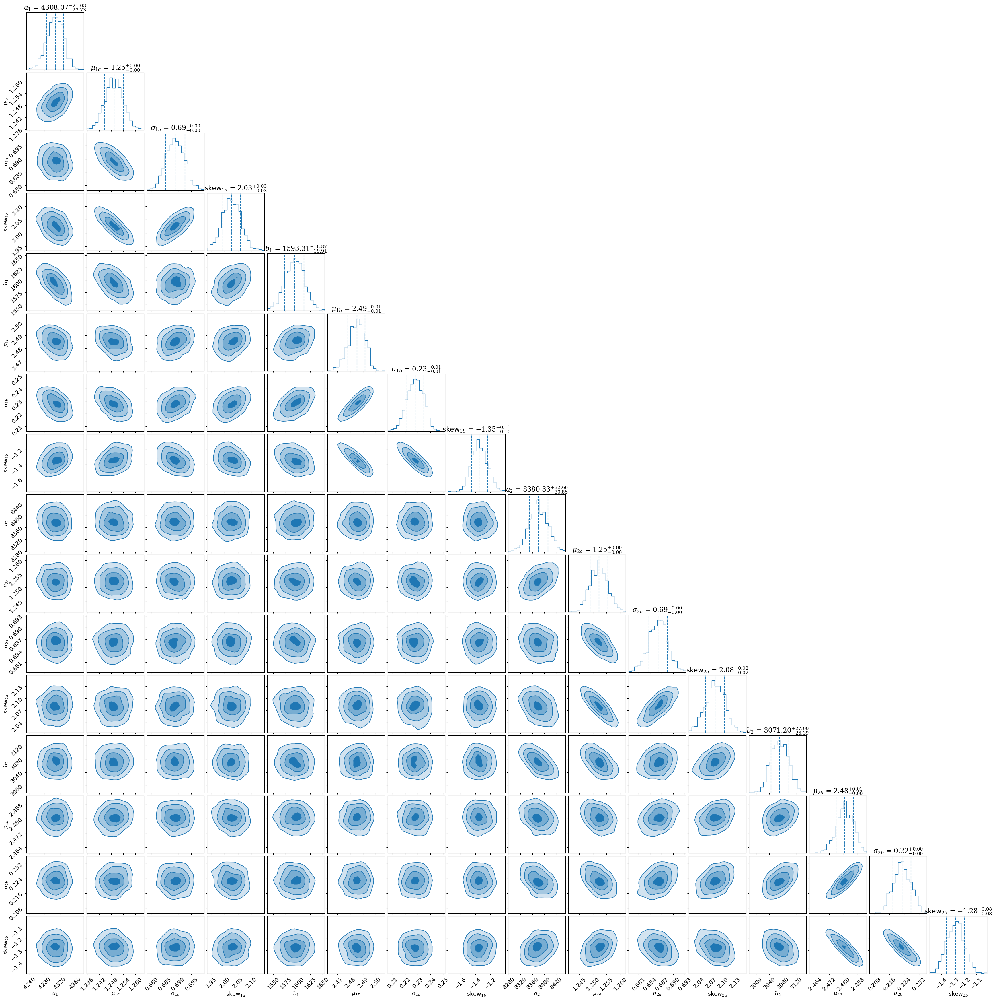

In [35]:
pc.plotting.corner(V2_0p1_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [36]:
lnzM2_V2_0p1 = V2_0p1_results2['logz'][-1]
lnzM2_V2_0p1

-1306.0818132308118

In [37]:
V2_0p1_bestfit2 = np.median(V2_0p1_results2['samples'], axis=0)

V2_0p1_bestfit2

array([ 4.3080679e+03,  1.2493732e+00,  6.8891561e-01,  2.0268807e+00,
        1.5933054e+03,  2.4852717e+00,  2.2775753e-01, -1.3485261e+00,
        8.3803330e+03,  1.2522081e+00,  6.8610954e-01,  2.0804486e+00,
        3.0711963e+03,  2.4806614e+00,  2.2287922e-01, -1.2778561e+00],
      dtype=float32)

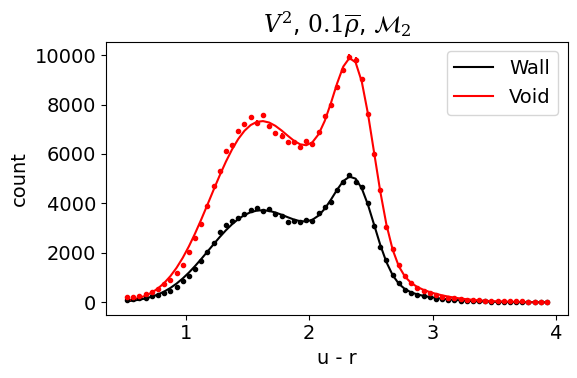

In [38]:
Model_2_plot(V2_0p1_bestfit2, 
             ur_NSA[wall_0p1], 
             ur_NSA[void_0p1], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [39]:
lnB12_V2_0p1 = lnzM1_V2_0p1 - lnzM2_V2_0p1

B12_V2_0p1 = np.exp(lnB12_V2_0p1)

print('V2 u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p1, lnB12_V2_0p1*np.log10(np.exp(1))))

V2 u-r: B12 = 6.05e+09; log(B12) = 9.782


## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [40]:
temp_infile = open('pocoMC_results/sampler_results_M1_u-r_V2-0p3.pickle', 'rb')
V2_0p3_results1 = pickle.load(temp_infile)
temp_infile.close()

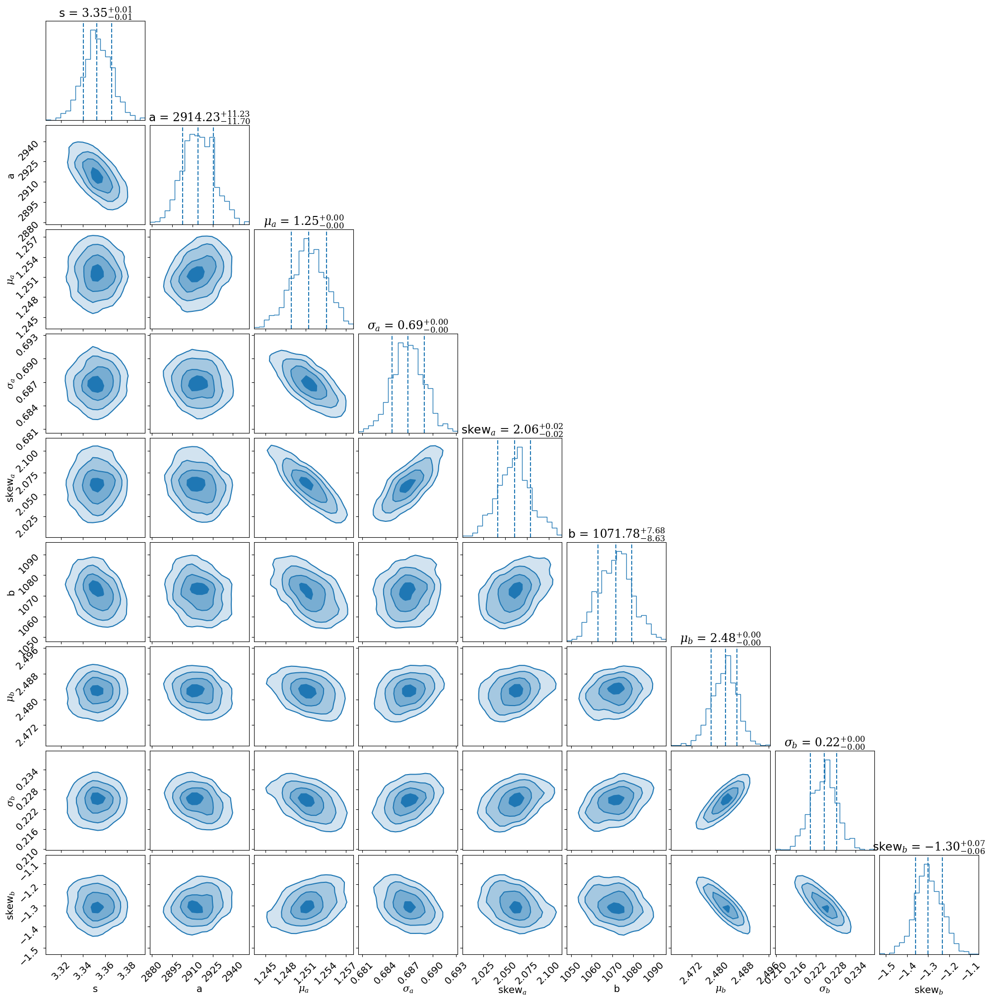

In [41]:
pc.plotting.corner(V2_0p3_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [42]:
lnzM1_V2_0p3 = V2_0p3_results1['logz'][-1]
lnzM1_V2_0p3

-1385.7489762536488

In [43]:
V2_0p3_bestfit1 = np.median(V2_0p3_results1['samples'], axis=0)

V2_0p3_bestfit1

array([ 3.3525333e+00,  2.9142319e+03,  1.2514215e+00,  6.8684733e-01,
        2.0609281e+00,  1.0717756e+03,  2.4825239e+00,  2.2460172e-01,
       -1.3018041e+00], dtype=float32)

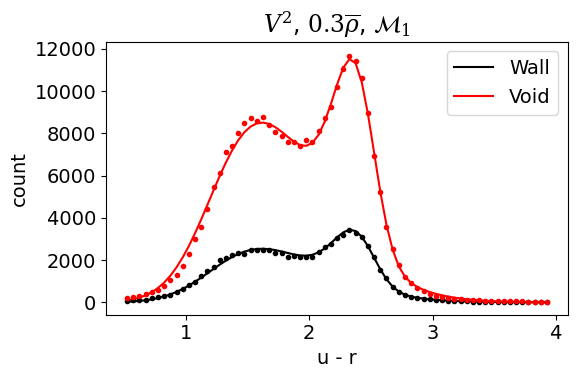

In [44]:
Model_1_plot(V2_0p3_bestfit1, 
             ur_NSA[wall_0p3], 
             ur_NSA[void_0p3], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_1$')

### 2-parent model

In [45]:
temp_infile = open('pocoMC_results/sampler_results_M2_u-r_V2-0p3.pickle', 'rb')
V2_0p3_results2 = pickle.load(temp_infile)
temp_infile.close()

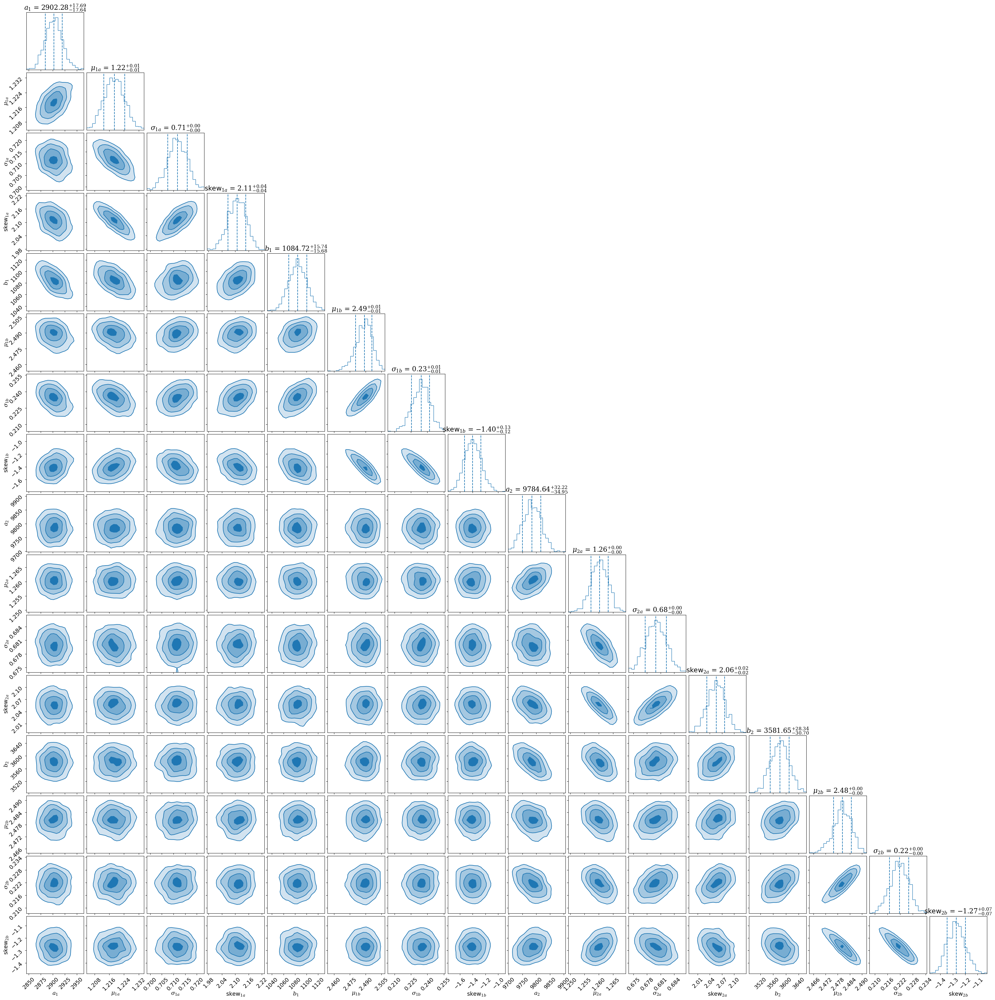

In [46]:
pc.plotting.corner(V2_0p3_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84], 
                   smooth=1, 
                   plot_datapoints=False, 
                   fill_contours=True);

In [47]:
lnzM2_V2_0p3 = V2_0p3_results2['logz'][-1]
lnzM2_V2_0p3

-1299.8843730859103

In [48]:
V2_0p3_bestfit2 = np.median(V2_0p3_results2['samples'], axis=0)

V2_0p3_bestfit2

array([ 2.9022822e+03,  1.2187915e+00,  7.1167779e-01,  2.1083498e+00,
        1.0847200e+03,  2.4889541e+00,  2.3451802e-01, -1.4035203e+00,
        9.7846357e+03,  1.2602880e+00,  6.7996299e-01,  2.0560267e+00,
        3.5816548e+03,  2.4804111e+00,  2.2164151e-01, -1.2721591e+00],
      dtype=float32)

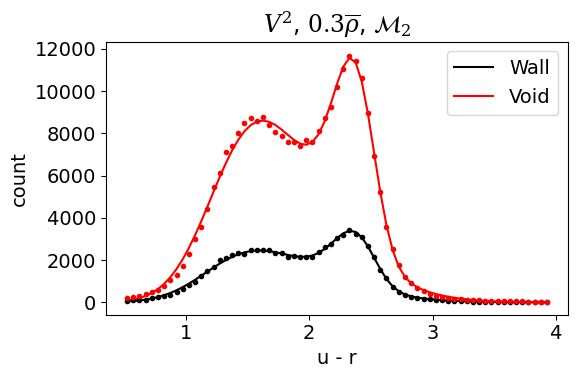

In [49]:
Model_2_plot(V2_0p3_bestfit2, 
             ur_NSA[wall_0p3], 
             ur_NSA[void_0p3], 
             ur_bins, 
             2, 
             xlabel_text='u - r', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [50]:
lnB12_V2_0p3 = lnzM1_V2_0p3 - lnzM2_V2_0p3

B12_V2_0p3 = np.exp(lnB12_V2_0p3)

print('V2 u-r: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p3, lnB12_V2_0p3*np.log10(np.exp(1))))

V2 u-r: B12 = 5.12e-38; log(B12) = -37.291
